In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# EASY

In [2]:
df = pd.read_csv('../data/CC GENERAL.csv')
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


## Гипотеза:
можно кластеризовать людей на нищих, бедных, средних, выше среднего и богатых 

In [3]:
df.dropna(inplace=True)
df.drop('CUST_ID', axis=1, inplace=True)
df = (df - df.min()) / (df.max() - df.min())
df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.002148,0.818182,0.001945,0.000000,0.004240,0.000000,0.166667,0.000000,0.083333,0.000000,0.00000,0.005587,0.031720,0.003978,0.001826,0.000000,1.0
1,0.168169,0.909091,0.000000,0.000000,0.000000,0.136685,0.000000,0.000000,0.000000,0.166667,0.03252,0.000000,0.232053,0.080892,0.014034,0.222222,1.0
2,0.131026,1.000000,0.015766,0.018968,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.033520,0.248748,0.012263,0.008210,0.000000,1.0
4,0.042940,1.000000,0.000326,0.000393,0.000000,0.000000,0.083333,0.083333,0.000000,0.000000,0.00000,0.002793,0.038397,0.013373,0.003204,0.000000,1.0
5,0.095038,1.000000,0.027188,0.000000,0.059257,0.000000,0.666667,0.000000,0.583333,0.000000,0.00000,0.022346,0.058431,0.027602,0.031506,0.000000,1.0


Почистили датасет. Хочется кластеризовать с помощью KMeans. Выясним оптимальный k для этого

/home/gabik/anaconda3/envs/hse_ml_course_2024/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/gabik/anaconda3/envs/hse_ml_course_2024/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/gabik/anaconda3/envs/hse_ml_course_2024/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/gabik/anaconda3/envs/hse_ml_course_2024/lib/python3.8/site-packages/sklearn/

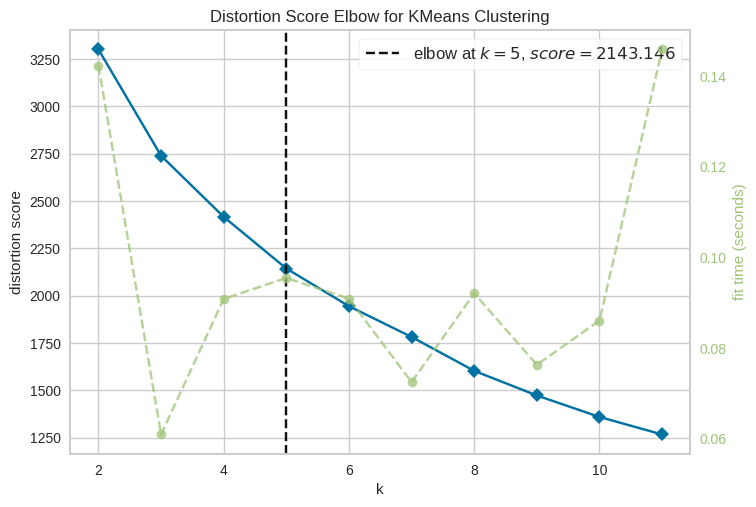

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [4]:
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2, 12))

visualizer.fit(df)  # Fit the data to the visualizer
visualizer.show()  # Finalize and render the figure

Видим, что оптимальнее всего взять k=5. Так и сделаем. Посмотрим какие классы мы получили и как они зависят от признаков

/home/gabik/anaconda3/envs/hse_ml_course_2024/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/gabik/anaconda3/envs/hse_ml_course_2024/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


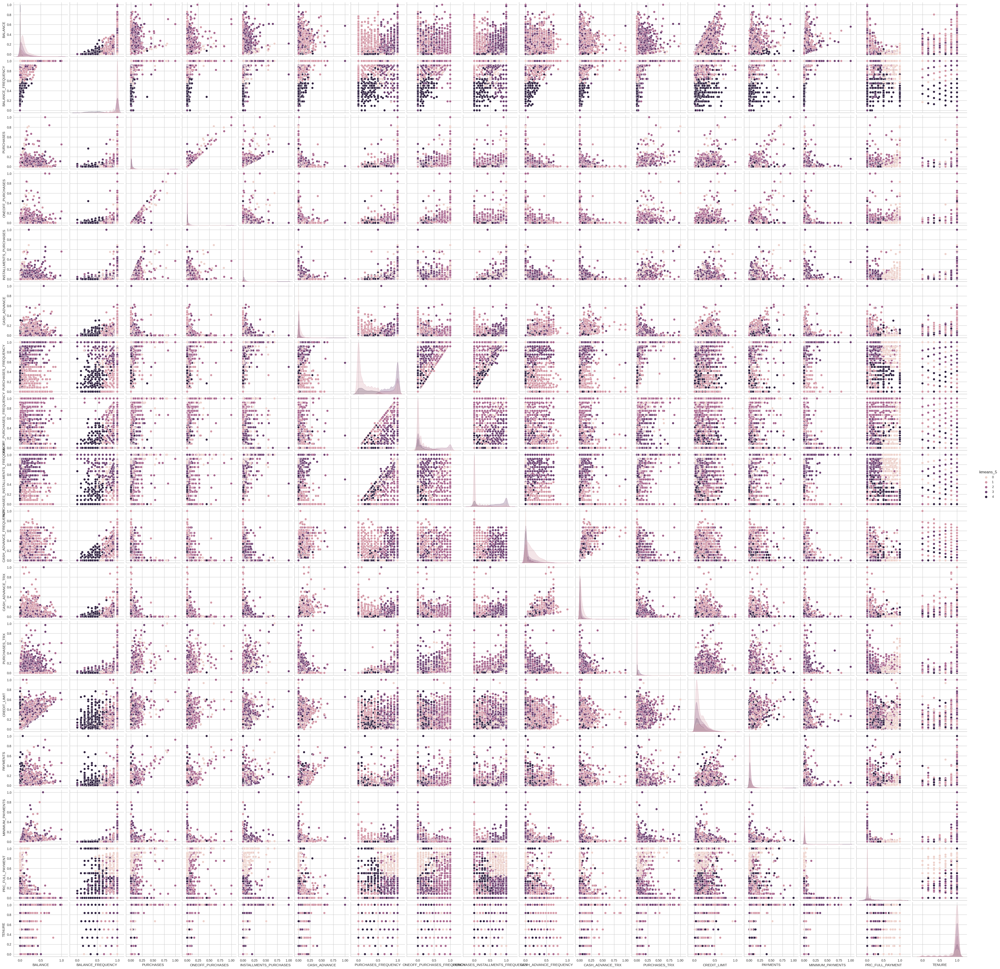

In [5]:
model_wine = KMeans(n_clusters=5)
model_labels = model_wine.fit_predict(df)
df['kmeans_5'] = model_labels
sns.pairplot(df, hue='kmeans_5')

Судя по графикам, лучше всего разделение идет по PURCHASES_FREQUENCY (частота покупок) и BALANCE_FREQUENCY (частота обновления баланса). Люди из разных групп хорошо делятся на частоту покупок, хотя и некоторые из них остаются вложенными. "На глаз" проинтерпретировать классы будет сложно, посмотрим на графики поближе

In [ ]:
columns = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
           'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
           'CASH_ADVANCE_FREQUENCY']
plt.scatter(df['BALANCE'], df['BALANCE_FREQUENCY'], c=model_labels, cmap='viridis')
for X_ in columns:
    for Y_ in columns:
        plt.scatter(df[X_], df[Y_], c=model_labels, cmap='viridis')
        plt.xlabel(X_)
        plt.ylabel(Y_)
        plt.show()

Эту секцию я правда запускал, чтобы посмотрел на графики поближе, но на гит не заливал, чтобы файл весил в разы поменьше. На самом деле в эти графики показывают что некоторые классы (например 1 и 2) хорошо различаются от остальных (0, 3, 4), но при этом между собой часто перемешиваются (видимо из-за зависимостей колонок)

# NORMAL 

Найдем оптимальное k для модели `AgglomerativeClustering`

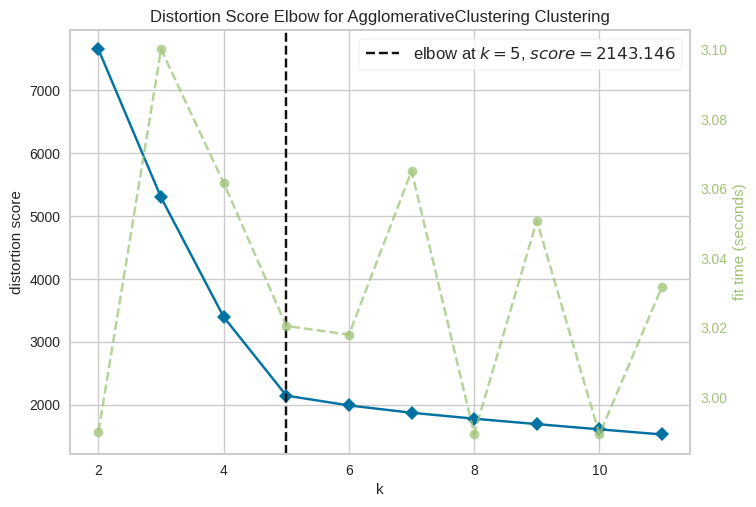

<Axes: title={'center': 'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [6]:
model = AgglomerativeClustering()
visualizer = KElbowVisualizer(model, k=(2, 12))

visualizer.fit(df)  # Fit the data to the visualizer
visualizer.show()  # Finalize and render the figure


Оно также равно 5, поэтому использовать будем его. Найдем также оптимальное значение для модели `DBSCAN`

In [7]:
from sklearn.metrics import silhouette_score # (b - a) / max(a, b) - где a, b расстояния внутри своего класса и до соседнего подробнее было на лекции

best = (-2, (0, 0)) # (best val, (eps, min_samples)) 
for eps10 in range(1, 13):
    eps = eps10 / 10
    for min_samples in range(2, 20):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        res = silhouette_score(df, dbscan.fit_predict(df))
        if res > best[0]:
            best = (res, (eps, min_samples))
print(best)

(0.6011109225749707, (0.9, 2))


In [8]:
models = (KMeans(n_clusters=5), AgglomerativeClustering(n_clusters=5), DBSCAN(eps=0.9, min_samples=2))
names = ["Kmeans 5", "AgglomerativeClustering 5", "DBSCAN 0.9, 2"]
for i in range(3):
    res = silhouette_score(df, models[i].fit_predict(df))
    print(f'{names[i]} silhouette score is: {res}')


/home/gabik/anaconda3/envs/hse_ml_course_2024/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Kmeans 5 silhouette score is: 0.6012595279422238
AgglomerativeClustering 5 silhouette score is: 0.6012595279422238
DBSCAN 0.9, 2 silhouette score is: 0.6011109225749707


Как можно заметить, при оптимальном выборе каждый метод справляется одинаково хорошо